Installing Ultralytics

In [ ]:
from ultralytics import YOLO
from IPython.display import Image, display
from IPython import display
import warnings
warnings.filterwarnings("ignore")
import os
import smtplib
import cv2
import numpy as np
from email.message import EmailMessage


/Users/prasanth/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


Model training

In [ ]:
%%time
model=YOLO('/Volumes/Prasanth 100gb/College Project/best 50.pt')
#results=model.train(data='/Volumes/Prasanth 100gb/College Project/Dangerous Action Detection.v3i.yolov8/data.yaml',epochs=2,imgsz=640,save_period=1)

CPU times: user 22.8 ms, sys: 8.68 ms, total: 31.5 ms
Wall time: 61.7 ms


Displaying images

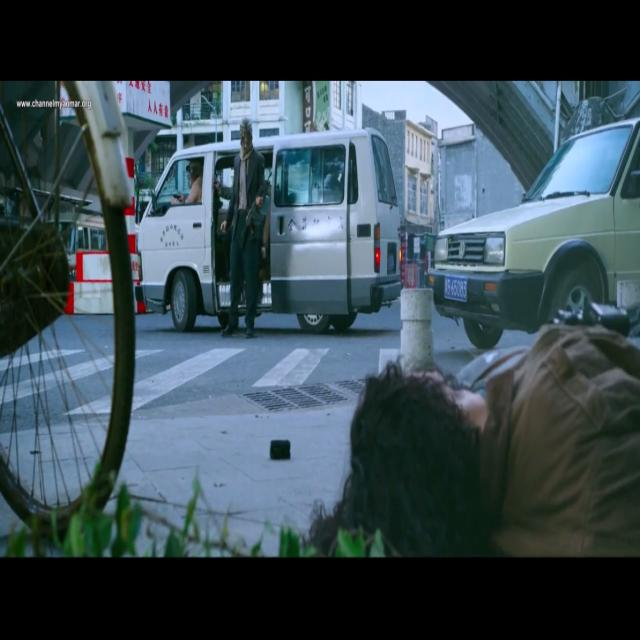

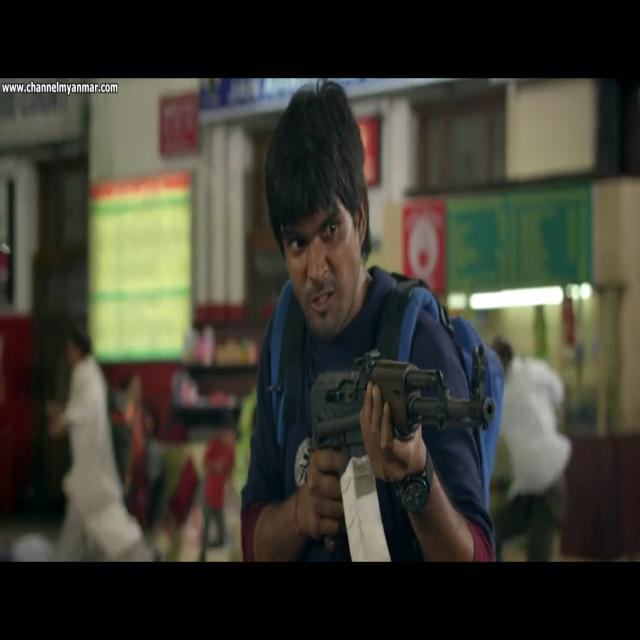

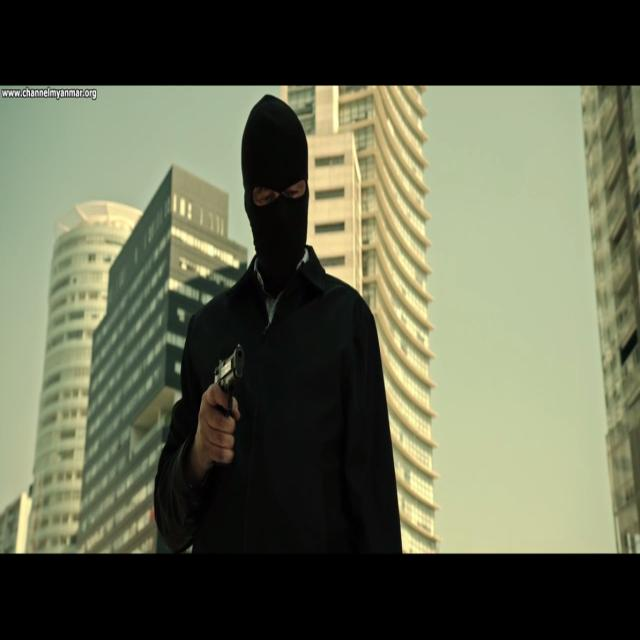

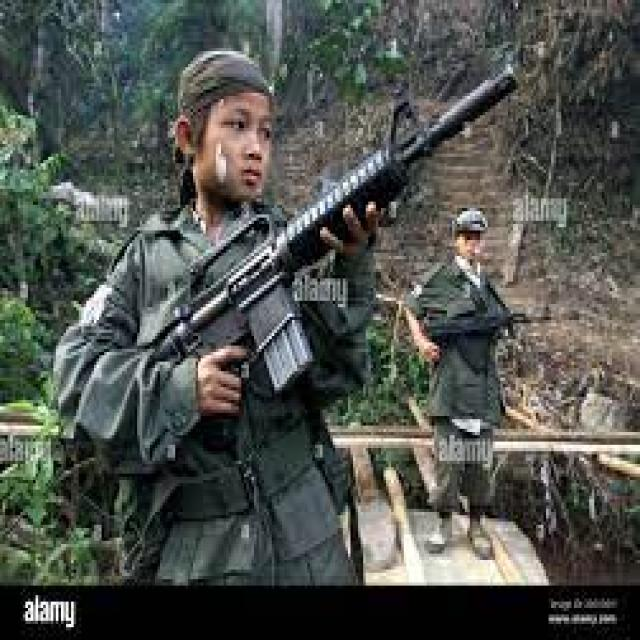

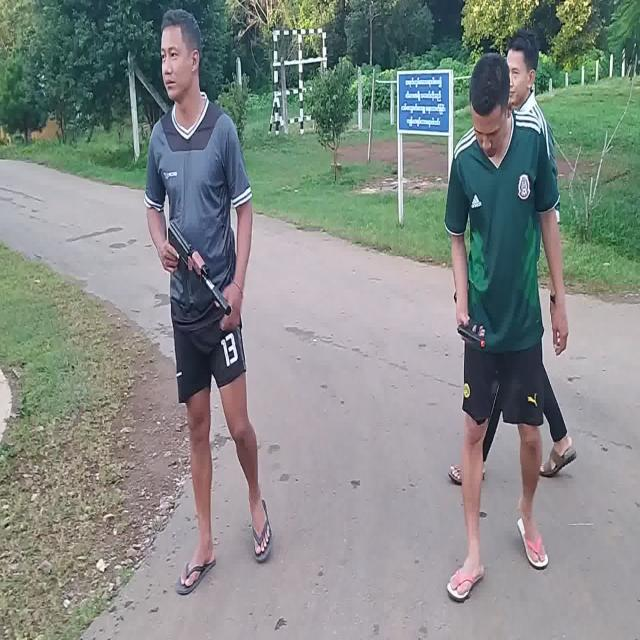

...

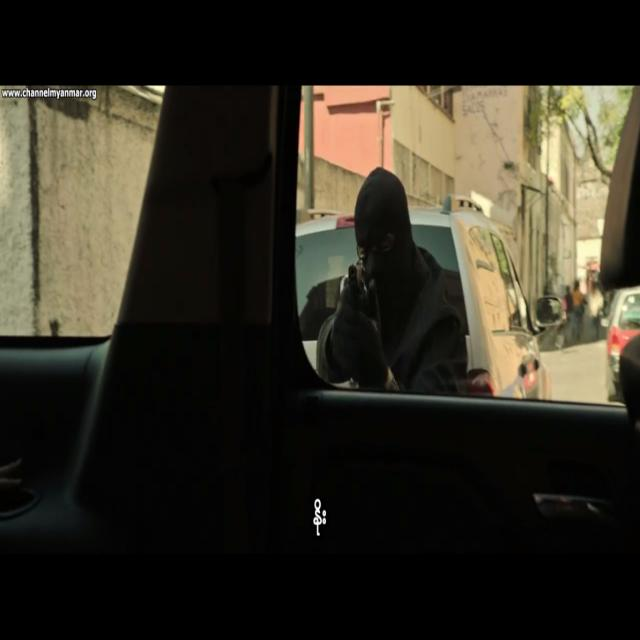

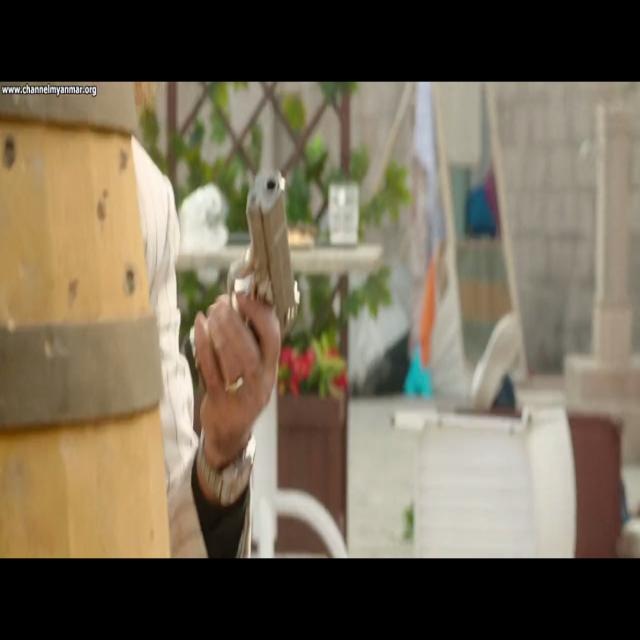

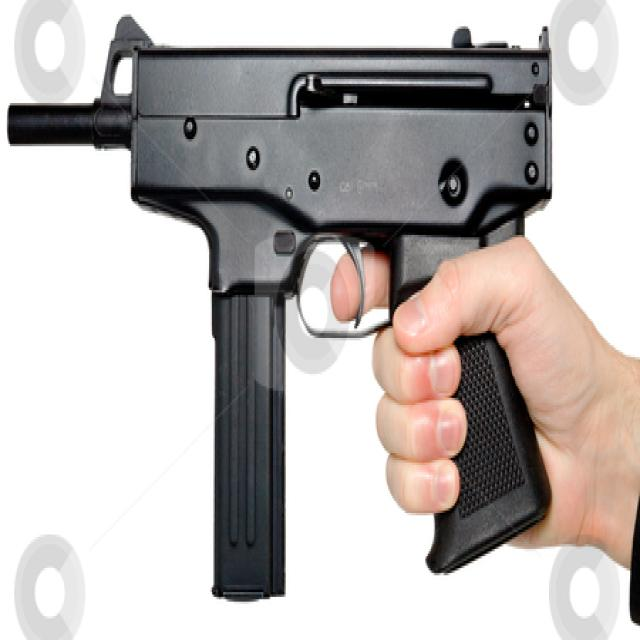

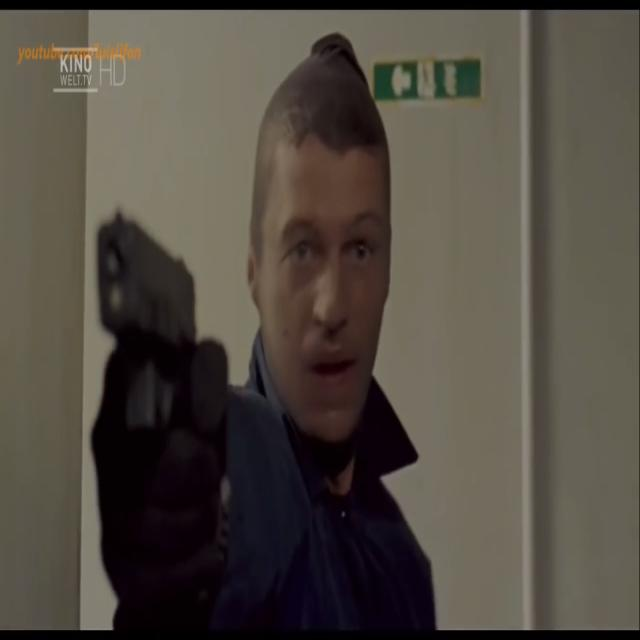

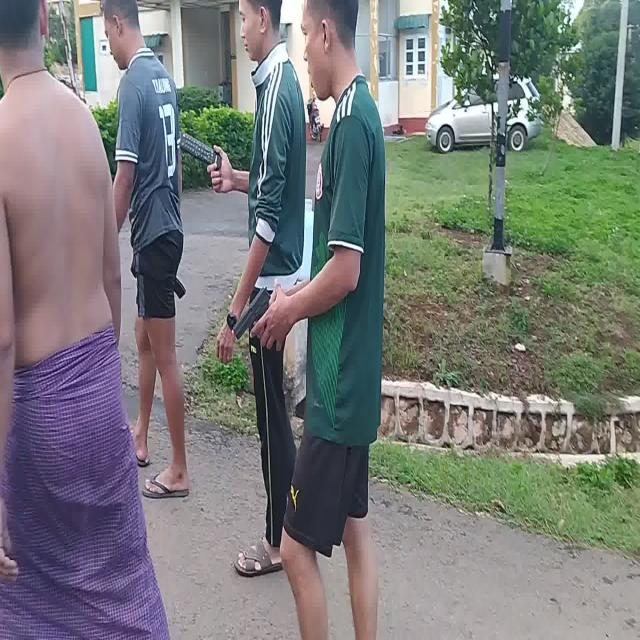

In [ ]:
#Image(filename=f'/content/runs/detect/predict2/',width=600)
'''folder='/Volumes/Prasanth 100gb/College Project/all data/test/images'
folder_list=os.listdir(folder)
for i in folder_list:
  display.display(Image(filename=f'/Volumes/Prasanth 100gb/College Project/all data/test/images/{i}',width=300))'''

Predicting video

In [ ]:
'''video='https://youtu.be/z6F5TmmW3SQ?si=BkoHoSFZBJR_sJDU'
results = model.predict(source=video, save=True, conf=0.5)'''

Realtime testing

In [ ]:
'''import cv2
res= model.predict(source='0', show=True)'''

In [ ]:
'''sender='thrishok26@gmail.com'
receiver='prasanthact8@gmail.com'
#sender=input("enter sender:")
#receiver=input("enter receiver:")
subject='alert'
message="this mail is from thrishok"
text=f"subject:{subject}\n\n{message}"

server=smtplib.SMTP("smtp.gmail.com",587)
server.starttls()
server.login(sender,"brcahqcblhkevlrd")
server.sendmail(sender,receiver,text)
print("email has been sent")'''

In [ ]:
cap = cv2.VideoCapture(0)  # Use webcam

N = 1  # Process every Nth frame
frame_counter = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame_counter += 1

    if frame_counter % N == 0:
        results = model(frame, verbose=False)  # Perform detection

        for result in results:
            for box in result.boxes:
                conf = float(box.conf[0])  # Confidence score
                cls_name = model.names[int(box.cls[0])]  # Detected object class

                print(f"Frame {frame_counter}: {cls_name} ({conf:.2f})")

                if cls_name in ['gun', 'suspicious', 'knife', 'scissors'] and conf > 0.7:
                    # Convert frame to bytes (without saving)
                    _, img_encoded = cv2.imencode('.jpg', frame)
                    img_bytes = img_encoded.tobytes()

                    # Email details
                    sender = 'thrishok26@gmail.com'
                    receiver = 'prasanthact8@gmail.com'
                    subject = 'ALERT: Suspicious Object Detected'
                    message = f"{cls_name} detected with {conf:.2f} confidence."

                    # Create email message
                    msg = EmailMessage()
                    msg['Subject'] = subject
                    msg['From'] = sender
                    msg['To'] = receiver
                    msg.set_content(message)

                    # Attach image
                    msg.add_attachment(img_bytes, maintype='image', subtype='jpeg', filename='detected_frame.jpg')

                    # Send email
                    server = smtplib.SMTP("smtp.gmail.com", 587)
                    server.starttls()
                    server.login(sender, "brcahqcblhkevlrd")  # Use App Password
                    server.send_message(msg)
                    server.quit()

                    print("Email with image sent!")

    # Display frame (optional)
    cv2.imshow('Frame', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()


Frame 1: suspicious (0.78)
Email with image sent!
Frame 1: suspicious (0.31)
Frame 2: person (0.75)
Frame 2: suspicious (0.33)
Frame 2: person (0.31)
Frame 3: suspicious (0.61)
Frame 3: person (0.58)
Frame 4: person (0.84)
Frame 4: person (0.46)
Frame 5: person (0.85)
Frame 5: person (0.45)
Frame 6: person (0.77)
Frame 6: person (0.45)
Frame 6: suspicious (0.30)
Frame 7: person (0.77)
Frame 7: person (0.58)
Frame 7: gun (0.32)
Frame 7: suspicious (0.27)
Frame 8: person (0.72)
Frame 8: person (0.53)
Frame 8: gun (0.30)
Frame 8: suspicious (0.27)


2025-02-18 12:49:00.259 Python[1804:94984] +[IMKClient subclass]: chose IMKClient_Modern
2025-02-18 12:49:00.259 Python[1804:94984] +[IMKInputSession subclass]: chose IMKInputSession_Modern


Frame 9: person (0.76)
Frame 9: person (0.44)
Frame 9: gun (0.32)
Frame 9: suspicious (0.30)
Frame 10: person (0.72)
Frame 10: person (0.65)
Frame 10: suspicious (0.49)
Frame 11: person (0.61)
Frame 11: person (0.59)
Frame 11: suspicious (0.50)
Frame 12: person (0.80)
Frame 12: person (0.59)
Frame 13: person (0.83)
Frame 13: person (0.60)
Frame 14: person (0.85)
Frame 14: person (0.66)
Frame 15: person (0.78)
Frame 15: person (0.73)
Frame 15: suspicious (0.37)
Frame 15: person (0.37)
Frame 16: person (0.81)
Frame 16: person (0.69)
Frame 17: person (0.84)
Frame 17: person (0.75)
Frame 18: person (0.77)
Frame 18: person (0.70)
Frame 18: suspicious (0.41)
Frame 19: suspicious (0.70)
Frame 19: person (0.69)
Frame 19: person (0.54)
Frame 19: person (0.52)
Frame 19: person (0.35)
Frame 20: person (0.67)
Frame 20: suspicious (0.67)
Frame 20: person (0.55)
Frame 20: person (0.53)
Frame 21: person (0.69)
Frame 21: suspicious (0.51)
Frame 21: person (0.41)
Frame 21: person (0.40)
Frame 21: perso